In [23]:
import os
import pandas as pd
from pathlib import Path
import numpy as np
import Functional_Fusion.atlas_map as am
from Functional_Fusion.dataset import DataSetMDTB, DataSetPontine
import Functional_Fusion.dataset as ds
from ProbabilisticParcellation.util import plot_multi_flat, plot_data_flat
import nibabel as nb
import subprocess
import scripts.paths as paths
import Functional_Fusion.connectivity as conn
import matplotlib.pyplot as plt
from scripts.var_decomp import reshape_data
import SUITPy as suit
import nitools as nt
import PcmPy as pcm
from nilearn import plotting

In [2]:
base_dir = paths.set_base_dir()
atlas_dir = paths.set_atlas_dir(base_dir)
dname = 'MDTB'
data_dir = base_dir + '/FunctionalFusion/' + dname
figure_dir = paths.set_figure_dir()

In [5]:
# -- Get resting-state subjects --
T = pd.read_csv(
    data_dir + '/participants.tsv', delimiter='\t')
subject_subset = T.participant_id[T['ses-rest'] == 1].tolist()



In [4]:
# Import data
# # --- Resting-state ---
mdtb_dataset = DataSetMDTB(data_dir)
data_rest, info_rest = mdtb_dataset.get_data(ses_id='ses-rest', type='Net67Run', space='MNISymC2', subj=subject_subset)
data_reshaped_rest = reshape_data(data_rest, info_rest, cond_column='net_id')


1
2
Setting 684740 nan values to zero.


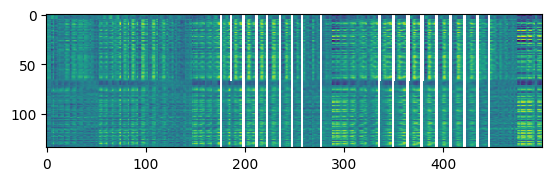

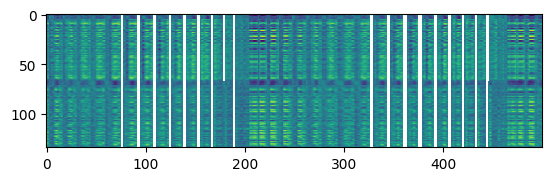

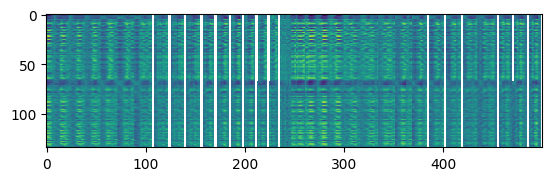

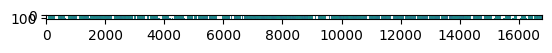

In [9]:
# Show data of subject 1
plt.imshow(data_rest[0, :, :500])
plt.figure()
plt.imshow(data_rest[0, :, 500:1000])
plt.figure()
plt.imshow(data_rest[0, :, 1000:1500])
plt.figure()
plt.imshow(data_rest[0, :, 1500:18290
])

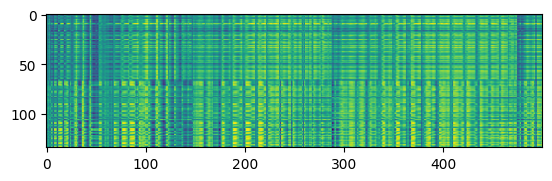

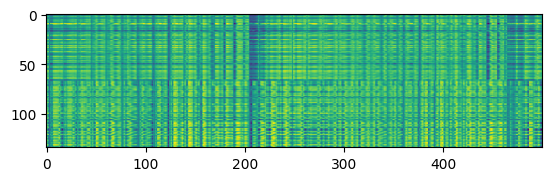

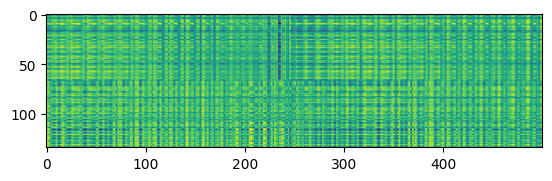

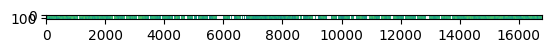

In [10]:
# Show data of subject 1
plt.imshow(data_rest[1, :, :500])
plt.figure()
plt.imshow(data_rest[1, :, 500:1000])
plt.figure()
plt.imshow(data_rest[1, :, 1000:1500])
plt.figure()
plt.imshow(data_rest[1, :, 1500:18290
])

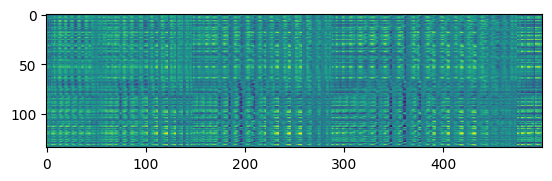

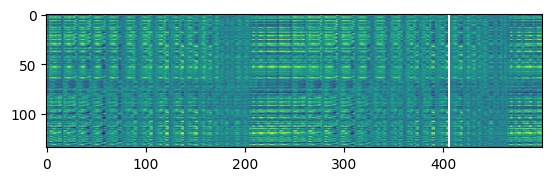

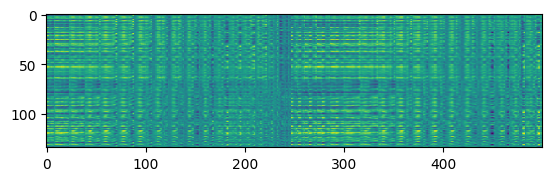

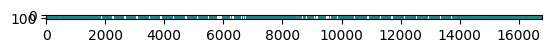

In [11]:
# Show data of subject 1
plt.imshow(data_rest[2, :, :500])
plt.figure()
plt.imshow(data_rest[2, :, 500:1000])
plt.figure()
plt.imshow(data_rest[2, :, 1000:1500])
plt.figure()
plt.imshow(data_rest[2, :, 1500:18290])

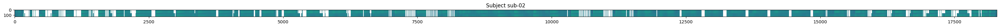

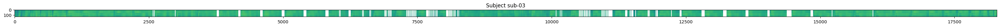

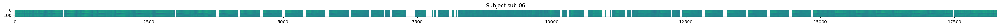

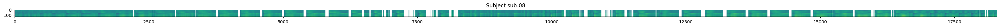

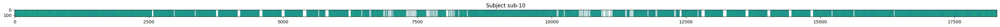

...

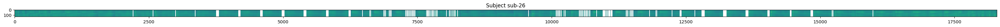

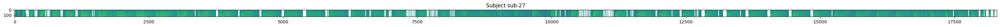

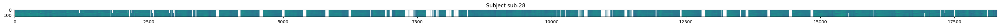

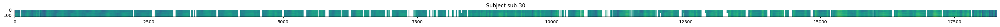

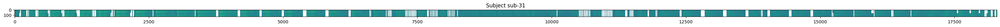

In [20]:
for sub in range(data_rest.shape[0]):
    plt.figure(figsize=(40, 10))
    plt.imshow(data_rest[sub, :, :])
    plt.title('Subject ' + str(subject_subset[sub]))

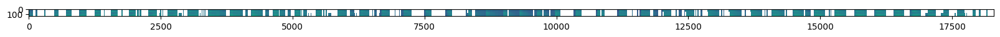

In [18]:
plt.figure(figsize=(20, 50))
plt.imshow(np.mean(data_rest, axis=0))

/var/folders/y1/13zjm1t50ms6ds24c69y7vx40000gn/T/ipykernel_27646/4112342695.py:2: RuntimeWarning: Mean of empty slice
  plt.imshow(np.nanmean(data_rest, axis=0))


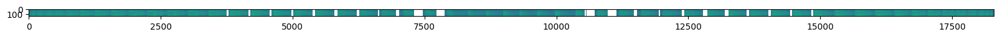

In [21]:
plt.figure(figsize=(20, 50))
plt.imshow(np.nanmean(data_rest, axis=0))

In [27]:
data_mean = np.nanmean(data_rest, axis=0)

/var/folders/y1/13zjm1t50ms6ds24c69y7vx40000gn/T/ipykernel_27646/3876034321.py:1: RuntimeWarning: Mean of empty slice
  data_mean = np.nanmean(data_rest, axis=0)


In [48]:
np.where(np.isnan(np.nanmean(data_mean, axis=0)))[0].shape

/var/folders/y1/13zjm1t50ms6ds24c69y7vx40000gn/T/ipykernel_27646/2190332003.py:1: RuntimeWarning: Mean of empty slice
  np.where(np.isnan(np.nanmean(data_mean, axis=0)))[0].shape


(120,)

/var/folders/y1/13zjm1t50ms6ds24c69y7vx40000gn/T/ipykernel_27646/2517860403.py:1: RuntimeWarning: Mean of empty slice
  np.nanmean(data_mean, axis=0)


array([0.07425454, 0.07521122, 0.0881956 , ..., 0.08612462, 0.09469706,
       0.07506754])

In [30]:
suit_atlas, ainf = am.get_atlas('MNISymC2', base_dir + 'FunctionalFusion/Atlases')
Nifti = suit_atlas.data_to_nifti(data_mean)
# Save Nifti using nibabel
nb.save(Nifti, 'data_mean.nii.gz')

# surf_data = suit.flatmap.vol_to_surf(Nifti, stats='mean',
#                                              space=ainf['normspace'])
# # plot_data_flat(data_mean, atlas='MNISymC2', dtype='func')

In [41]:
nb.save(Nifti, 'data_mean.nii.gz')


In [32]:
suit_atlas, ainf = am.get_atlas('MNISymC2', base_dir + 'FunctionalFusion/Atlases')
Nifti = suit_atlas.data_to_nifti(data_mean)
surf_data = suit.flatmap.vol_to_surf(Nifti, stats='mean',
                                             space=ainf['normspace'])
surf_data = np.nan_to_num(surf_data)

cmap=None,
dtype='label',
cscale=None,
labels=None,
render='matplotlib',
colorbar=False,
bordersize=4,
bordercolor='k',
backgroundcolor='w'
ax = suit.flatmap.plot(surf_data,
                        render='matplotlib',
                        new_figure=False,
                        overlay_type='func',
                        colorbar=colorbar)

In [49]:
data_rest.shape

(17, 134, 18290)

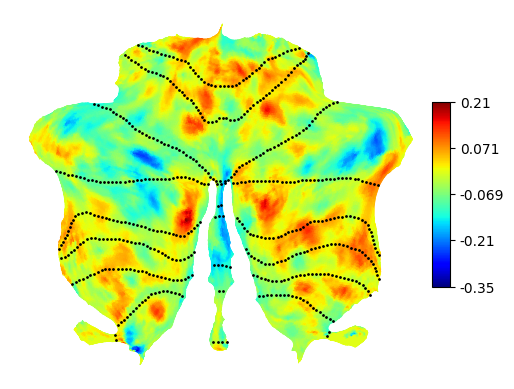

In [50]:
Nifti = suit_atlas.data_to_nifti(data_rest[0,:,:])
surf_data = suit.flatmap.vol_to_surf(Nifti, stats='nanmean',
                                             space=ainf['normspace'])
surf_data = np.nan_to_num(surf_data)

cmap=None,
dtype='label',
cscale=None,
labels=None,
render='matplotlib',
colorbar=False,
bordersize=4,
bordercolor='k',
backgroundcolor='w'
ax = suit.flatmap.plot(surf_data,
                        render='matplotlib',
                        new_figure=False,
                        overlay_type='func',
                        colorbar=colorbar)

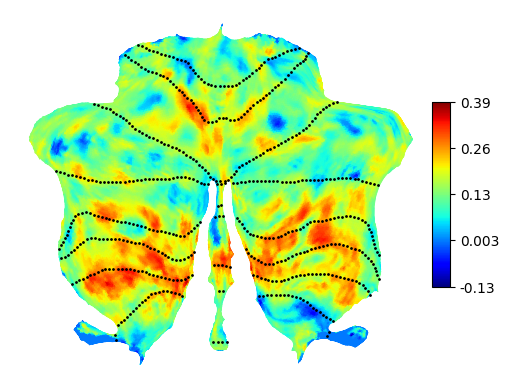

In [51]:
Nifti = suit_atlas.data_to_nifti(data_rest[1,:,:])
surf_data = suit.flatmap.vol_to_surf(Nifti, stats='nanmean',
                                             space=ainf['normspace'])
surf_data = np.nan_to_num(surf_data)

cmap=None,
dtype='label',
cscale=None,
labels=None,
render='matplotlib',
colorbar=False,
bordersize=4,
bordercolor='k',
backgroundcolor='w'
ax = suit.flatmap.plot(surf_data,
                        render='matplotlib',
                        new_figure=False,
                        overlay_type='func',
                        colorbar=colorbar)

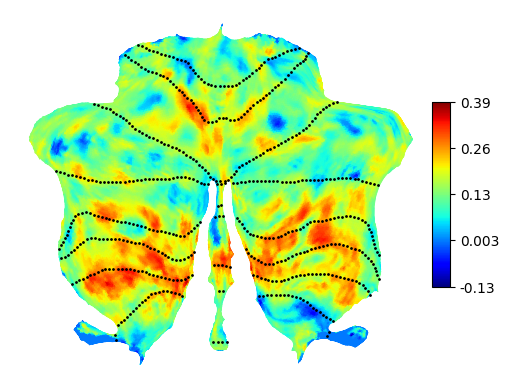

In [52]:
Nifti = suit_atlas.data_to_nifti(data_rest[1,0,:])
surf_data = suit.flatmap.vol_to_surf(Nifti, stats='nanmean',
                                             space=ainf['normspace'])
surf_data = np.nan_to_num(surf_data)

cmap=None,
dtype='label',
cscale=None,
labels=None,
render='matplotlib',
colorbar=False,
bordersize=4,
bordercolor='k',
backgroundcolor='w'
ax = suit.flatmap.plot(surf_data,
                        render='matplotlib',
                        new_figure=False,
                        overlay_type='func',
                        colorbar=colorbar)

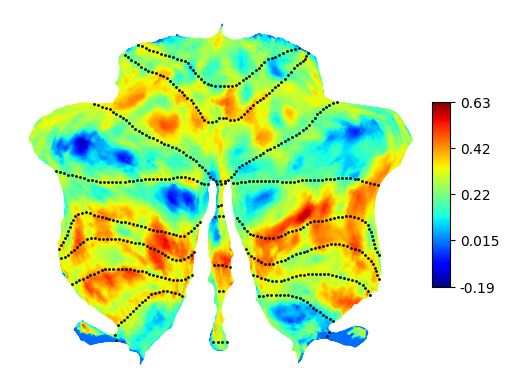

In [53]:
Nifti = suit_atlas.data_to_nifti(data_rest[1,1,:])
surf_data = suit.flatmap.vol_to_surf(Nifti, stats='nanmean',
                                             space=ainf['normspace'])
surf_data = np.nan_to_num(surf_data)

cmap=None,
dtype='label',
cscale=None,
labels=None,
render='matplotlib',
colorbar=False,
bordersize=4,
bordercolor='k',
backgroundcolor='w'
ax = suit.flatmap.plot(surf_data,
                        render='matplotlib',
                        new_figure=False,
                        overlay_type='func',
                        colorbar=colorbar)

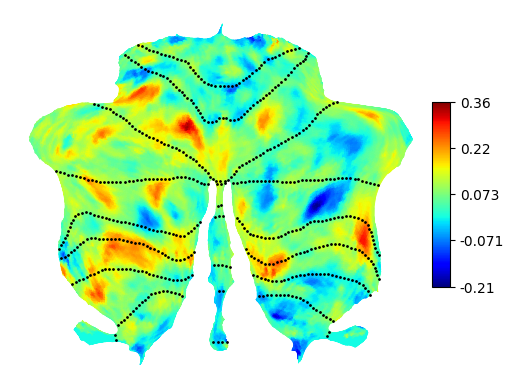

In [54]:
Nifti = suit_atlas.data_to_nifti(data_rest[2,:,:])
surf_data = suit.flatmap.vol_to_surf(Nifti, stats='nanmean',
                                             space=ainf['normspace'])
surf_data = np.nan_to_num(surf_data)

cmap=None,
dtype='label',
cscale=None,
labels=None,
render='matplotlib',
colorbar=False,
bordersize=4,
bordercolor='k',
backgroundcolor='w'
ax = suit.flatmap.plot(surf_data,
                        render='matplotlib',
                        new_figure=False,
                        overlay_type='func',
                        colorbar=colorbar)

## Mean connectivity maps across subjects

In [73]:
data_rest = np.nanmean(data_reshaped_rest, axis=1)

<Axes: >

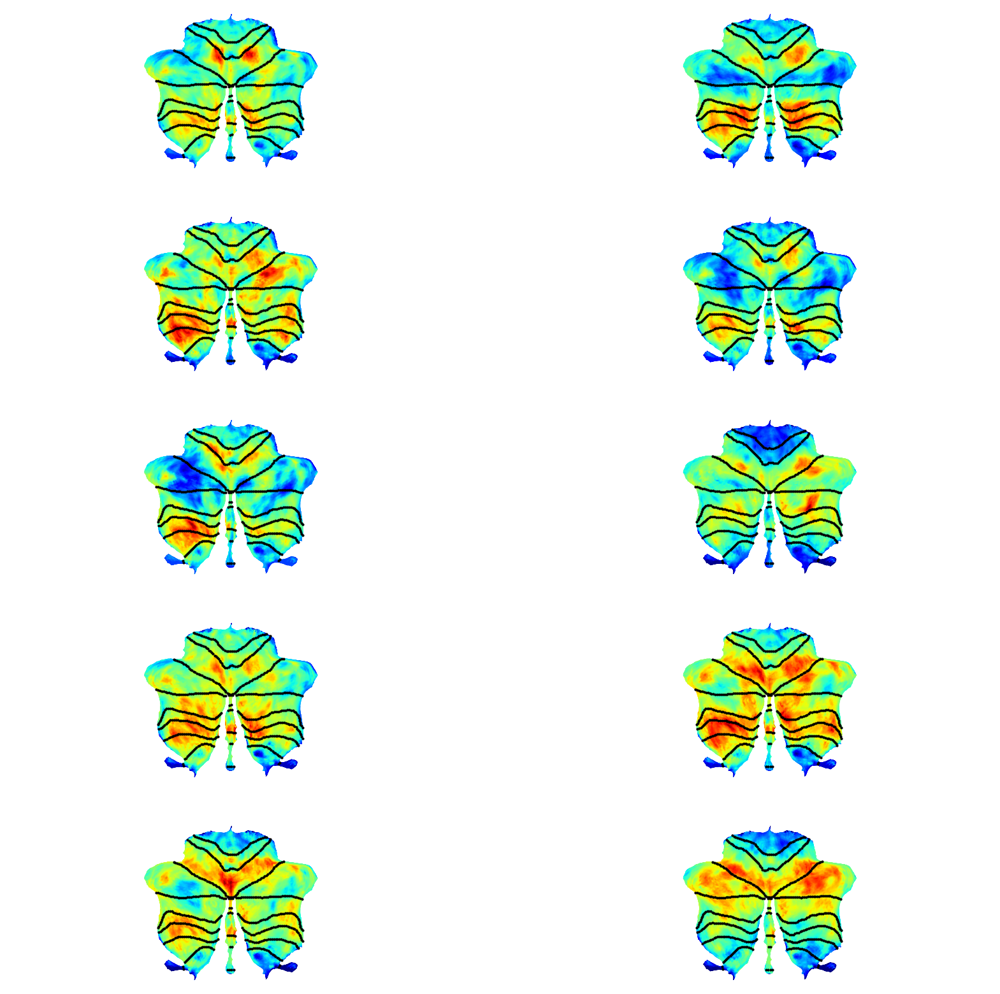

In [74]:
mean_across_subjects = np.nanmean(data_rest[:,:10,:], axis=0)
plt.figure(figsize=(20, 20))
plot_multi_flat(mean_across_subjects, atlas='MNISymC2', dtype='func', grid=(5,2))

## Mean connectivity map for each subject

In [90]:
mean_across_networks.shape

(17, 18290)

<Axes: title={'center': 'sub-22'}>

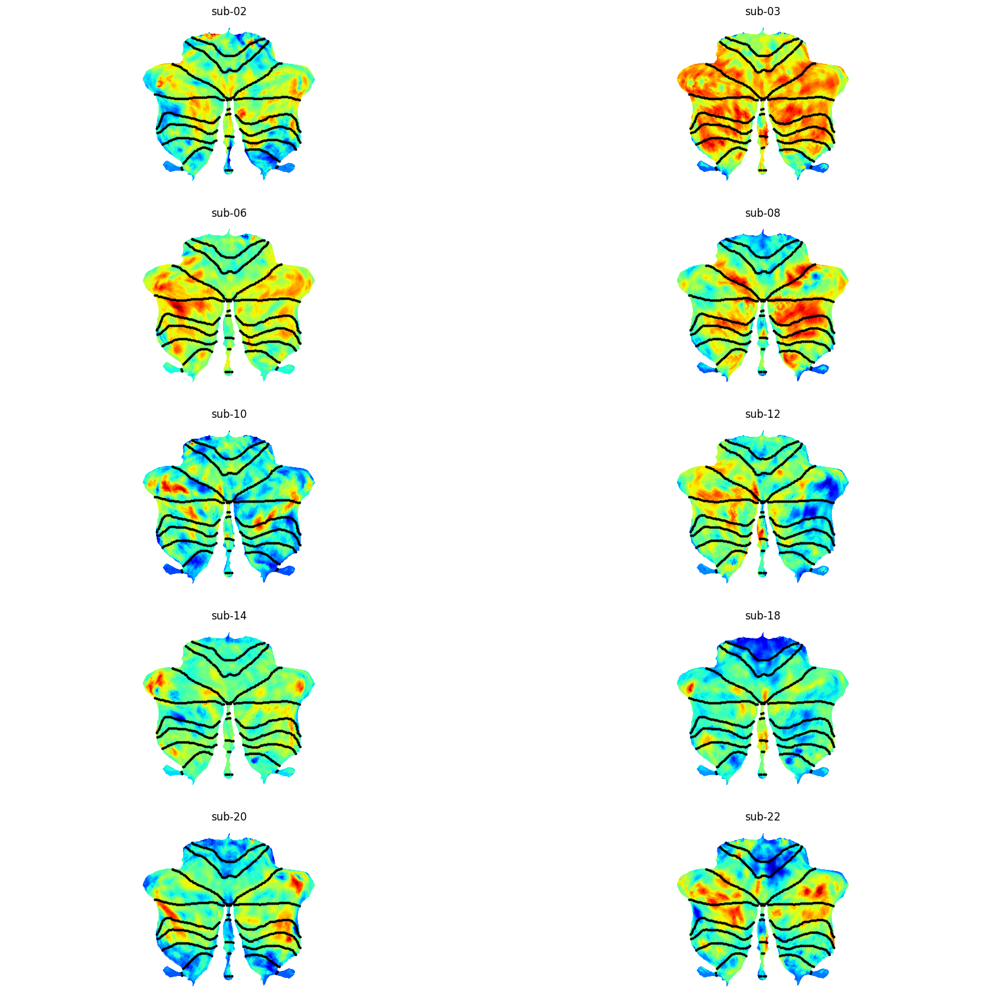

In [89]:
mean_across_networks = np.nanmean(data_rest, axis=1)
plt.figure(figsize=(20, 20))
plot_multi_flat(mean_across_networks[:10,:], atlas='MNISymC2', dtype='func', grid=(5,2), titles=subject_subset[:10])

### Connectivity maps of first subject (sub-02)

<Axes: >

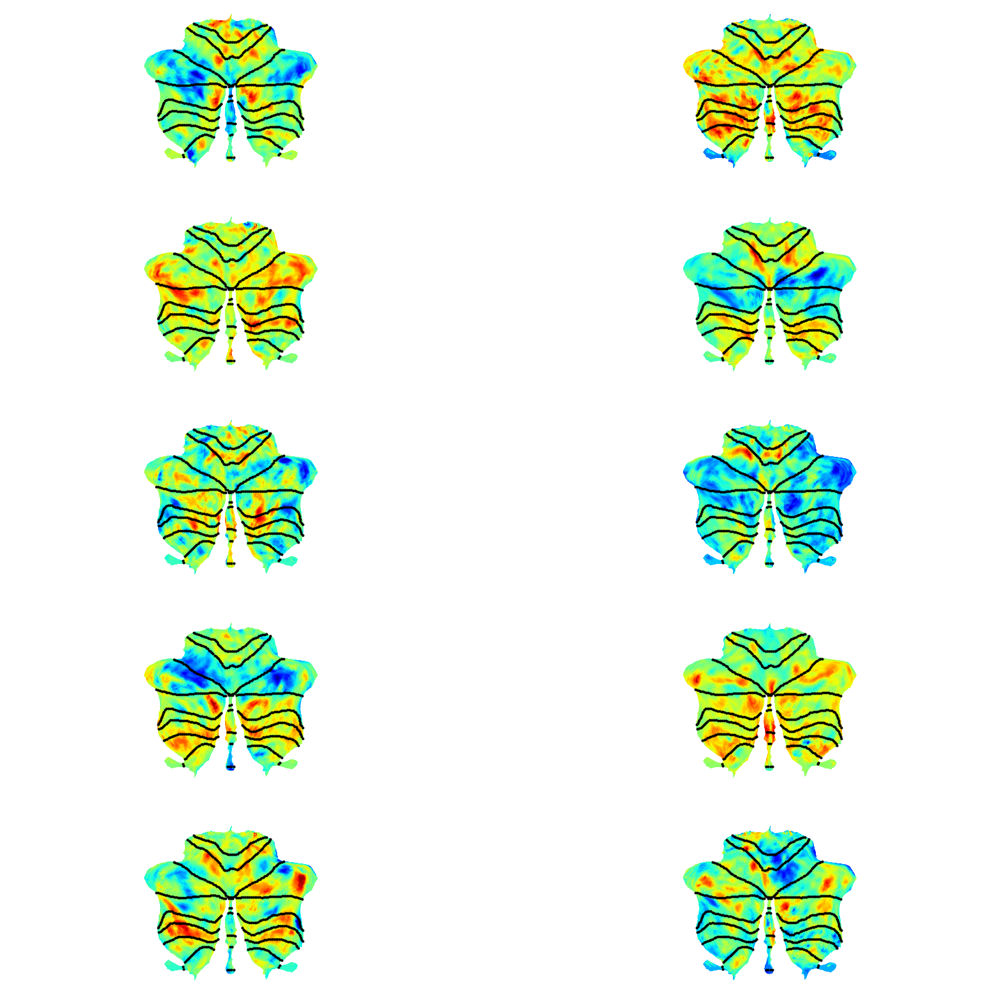

In [75]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:10,0,:], atlas='MNISymC2', dtype='func', grid=(5, 2))

### Connectivity maps of first 10 subjects for second network

<Axes: title={'center': 'sub-22'}>

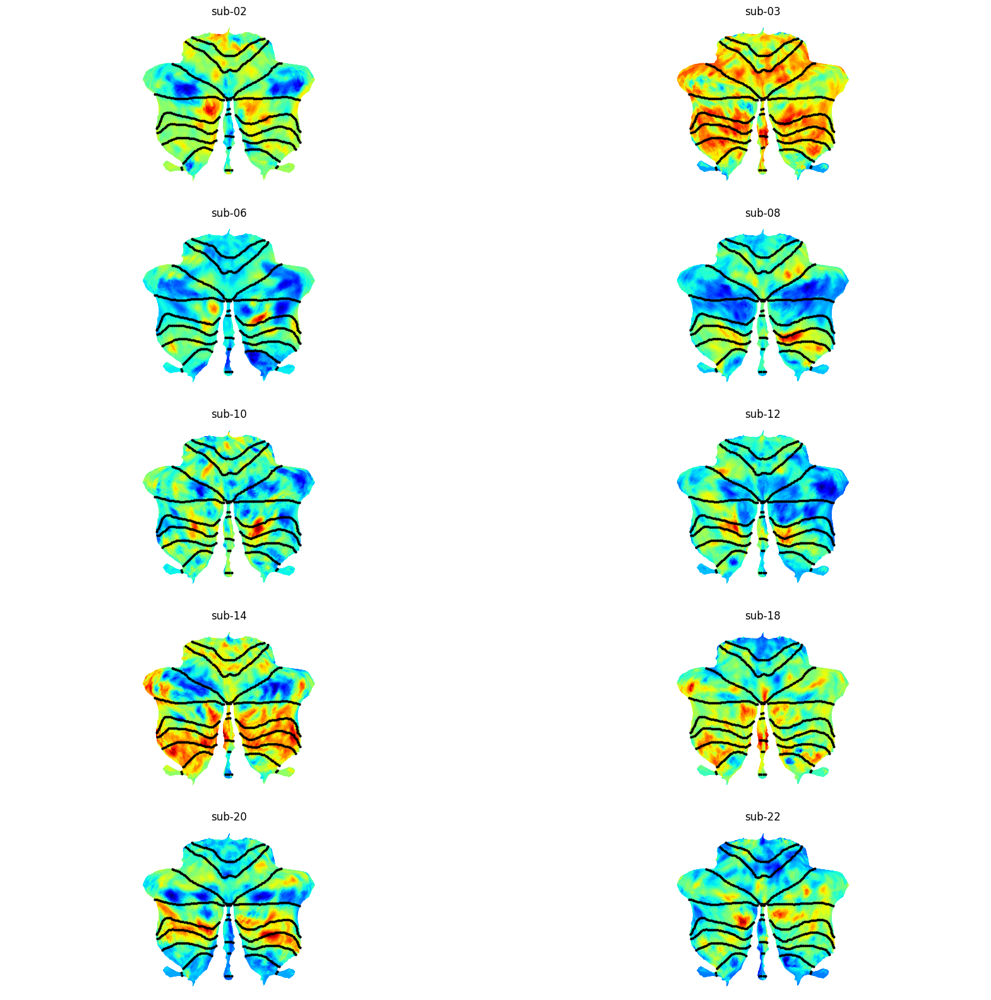

In [76]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:10,1,:], atlas='MNISymC2', dtype='func', grid=(5, 2), titles=subject_subset[:10])

### Connectivity maps of first 10 subjects for fourth network

<Axes: title={'center': 'sub-22'}>

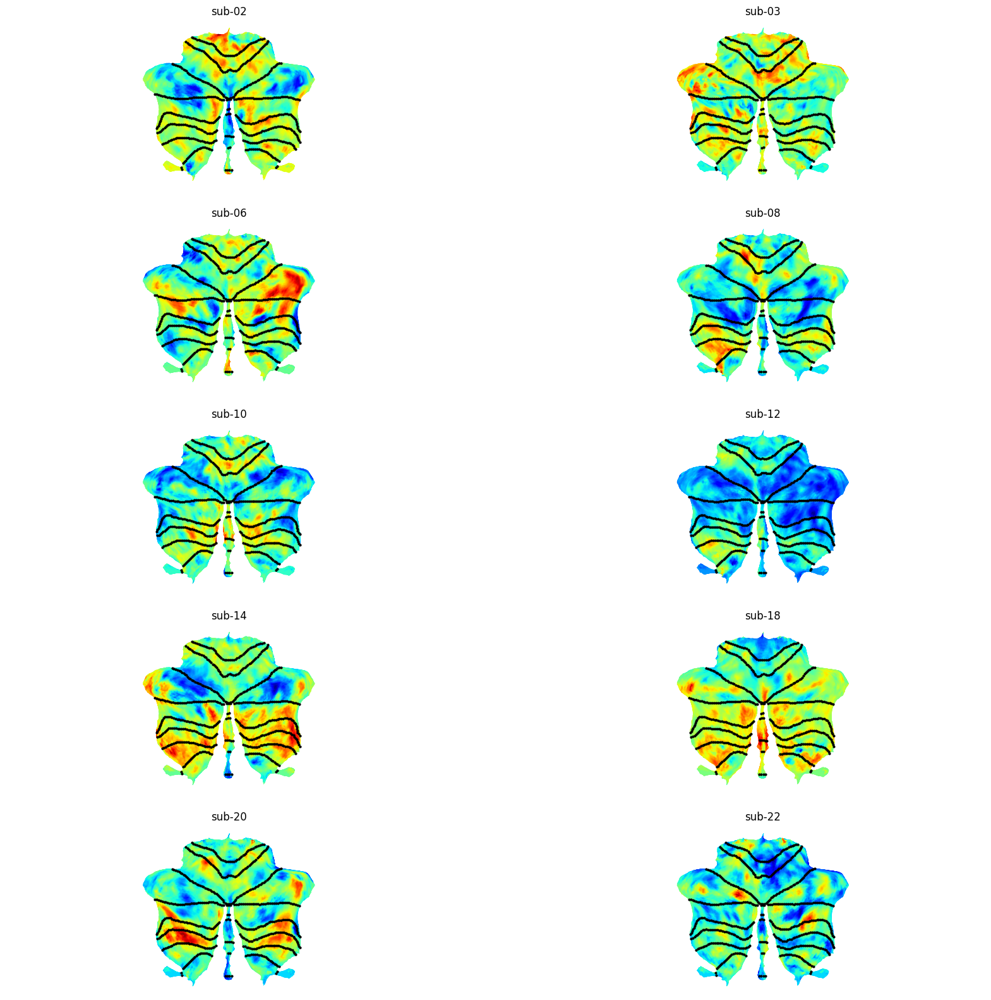

In [77]:
plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:10,4,:], atlas='MNISymC2', dtype='func', grid=(5, 2), titles=subject_subset[:10])

### Connectivity maps of first 10 networks for first subject (sub-02)

<Axes: >

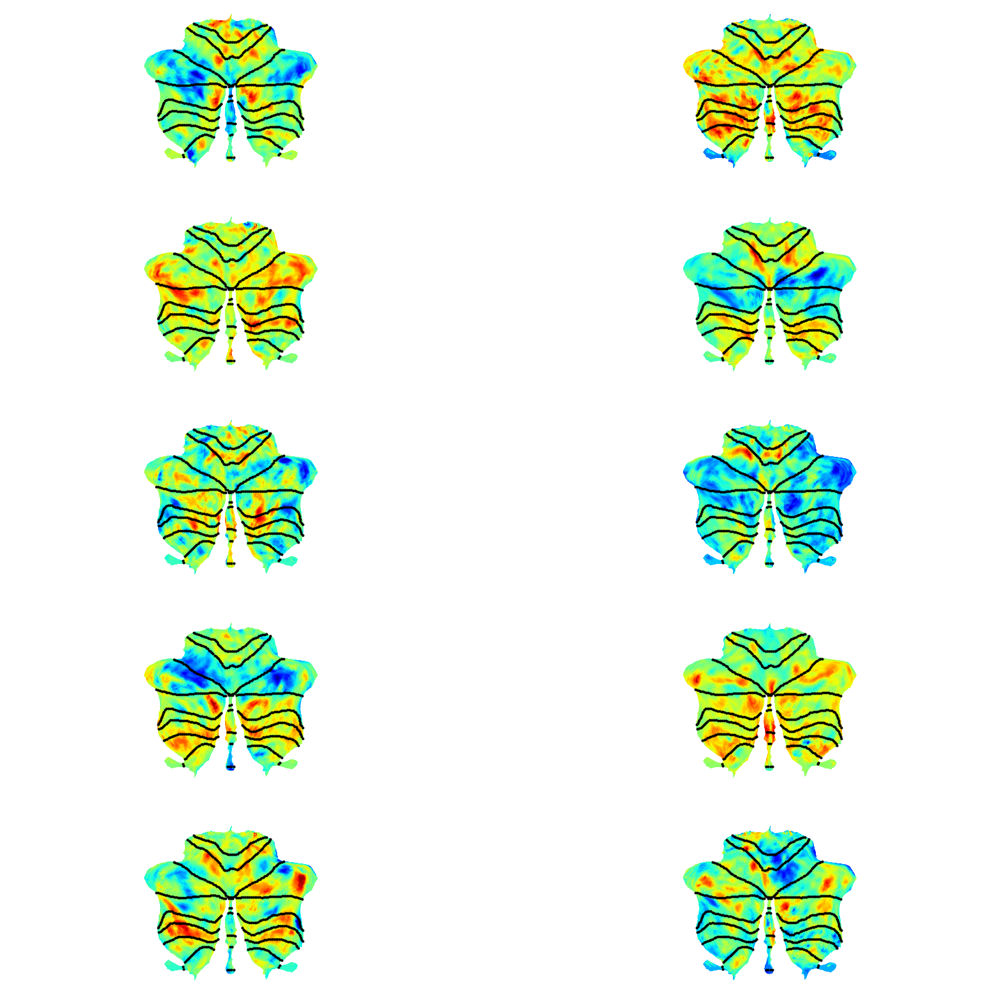

In [80]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:10,0,:], atlas='MNISymC2', dtype='func', grid=(5, 2))

### Connectivity maps of first 10 networks for for second subject (sub-03)

<Axes: >

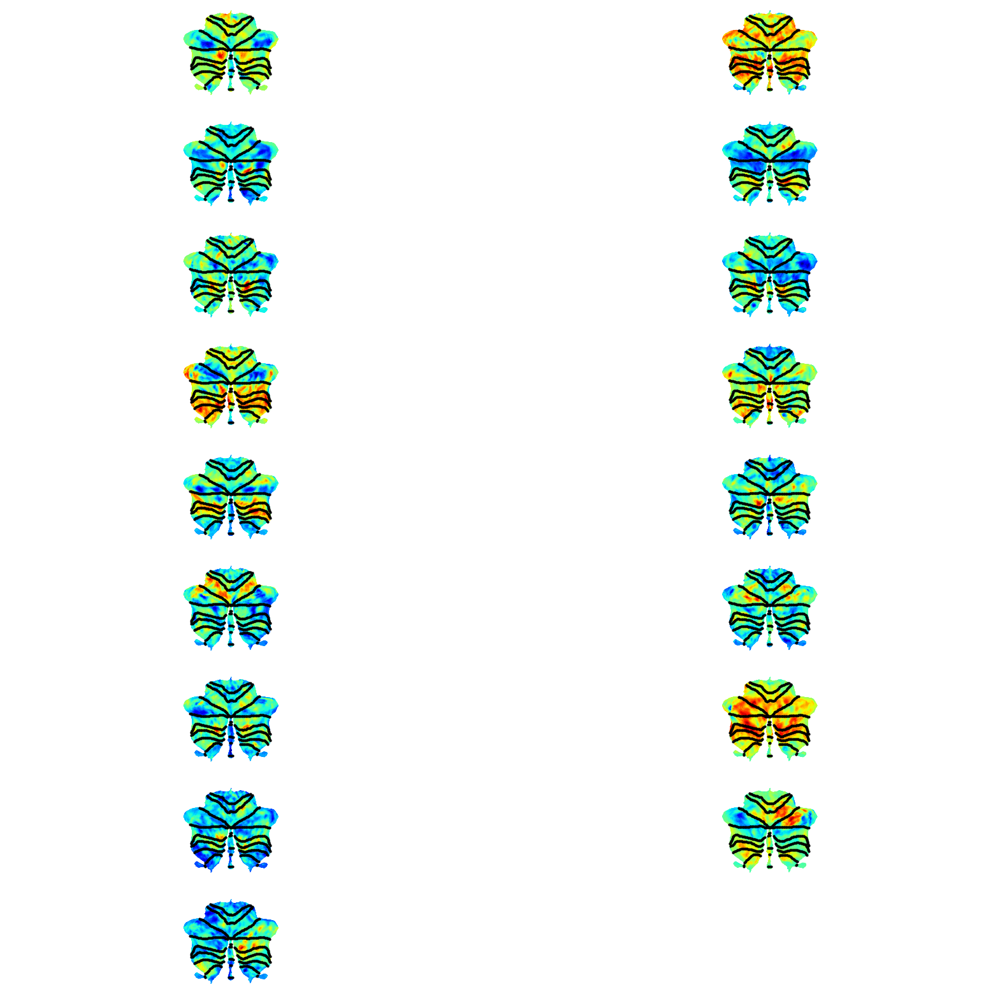

In [91]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:,1,:], atlas='MNISymC2', dtype='func', grid=(9, 2))

<Axes: >

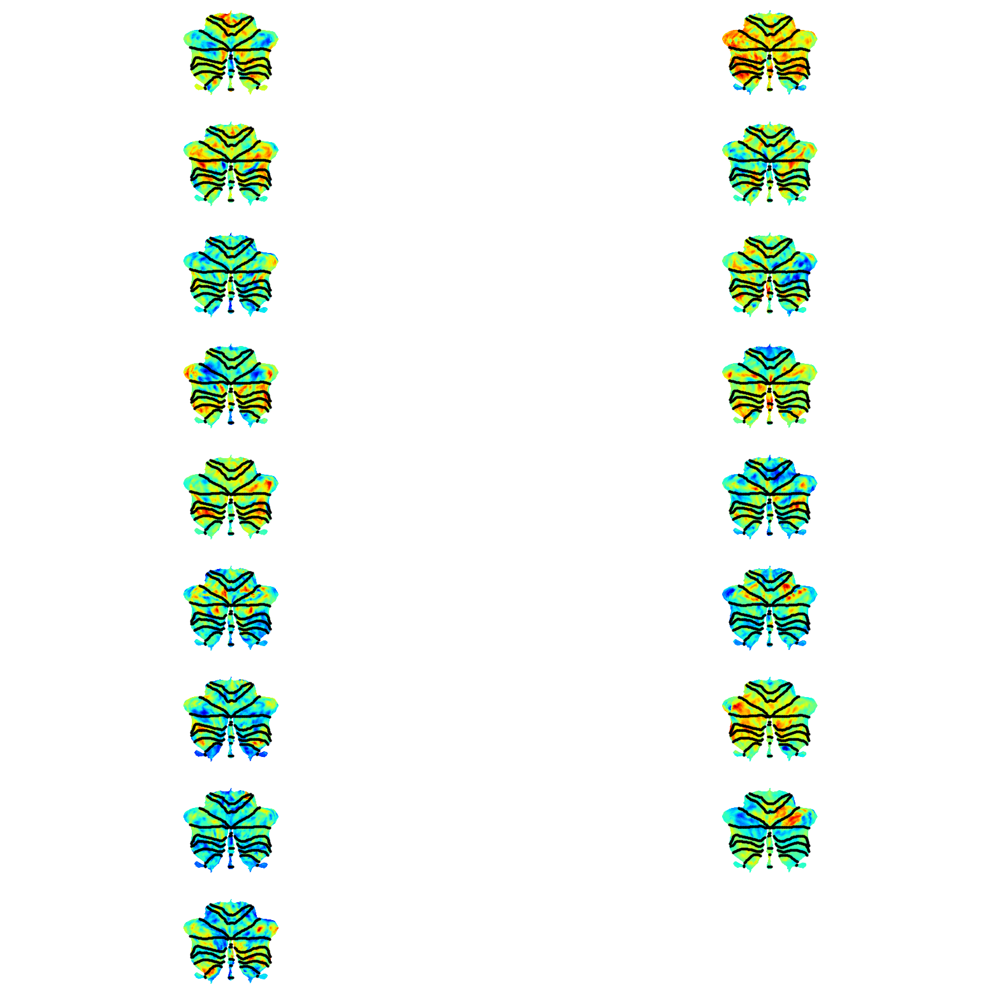

In [92]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:,2,:], atlas='MNISymC2', dtype='func', grid=(9, 2))

<Axes: >

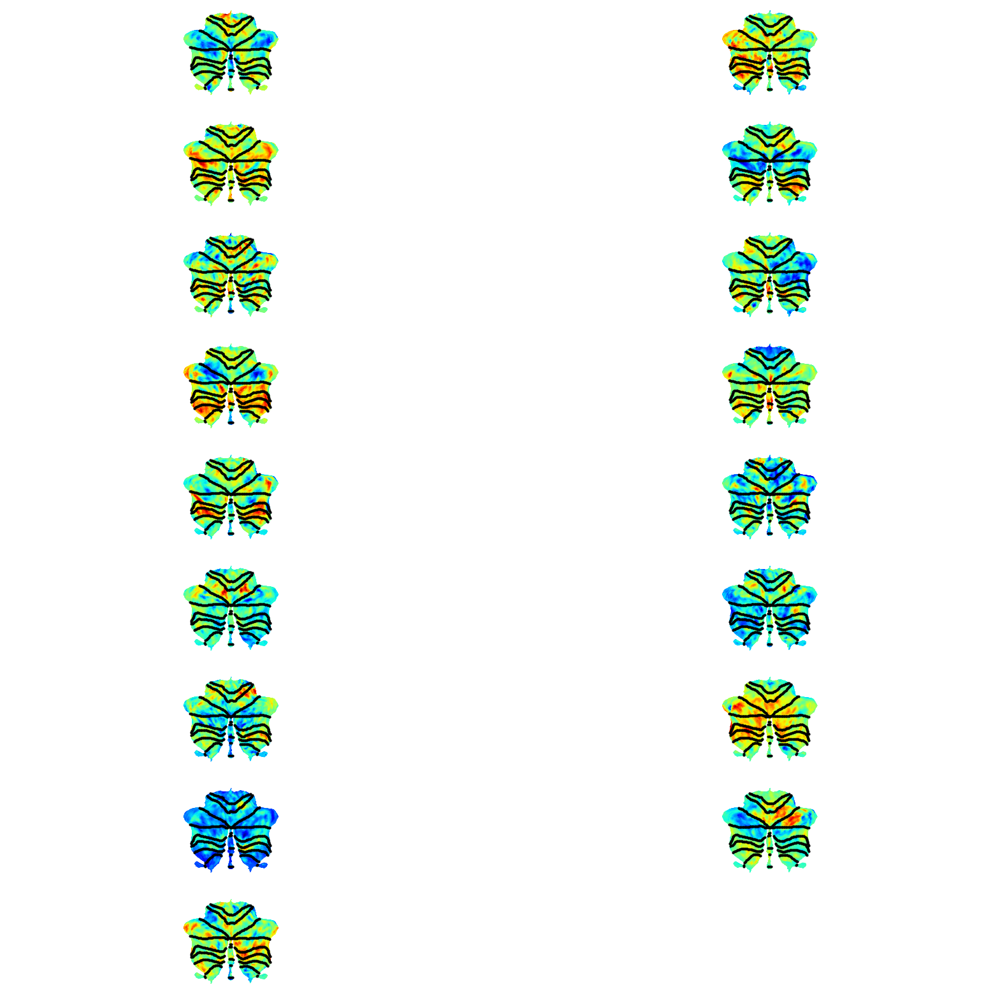

In [93]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:,3,:], atlas='MNISymC2', dtype='func', grid=(9, 2))

### Connectivity maps of first 10 networks for for third subject (sub-06)

<Axes: >

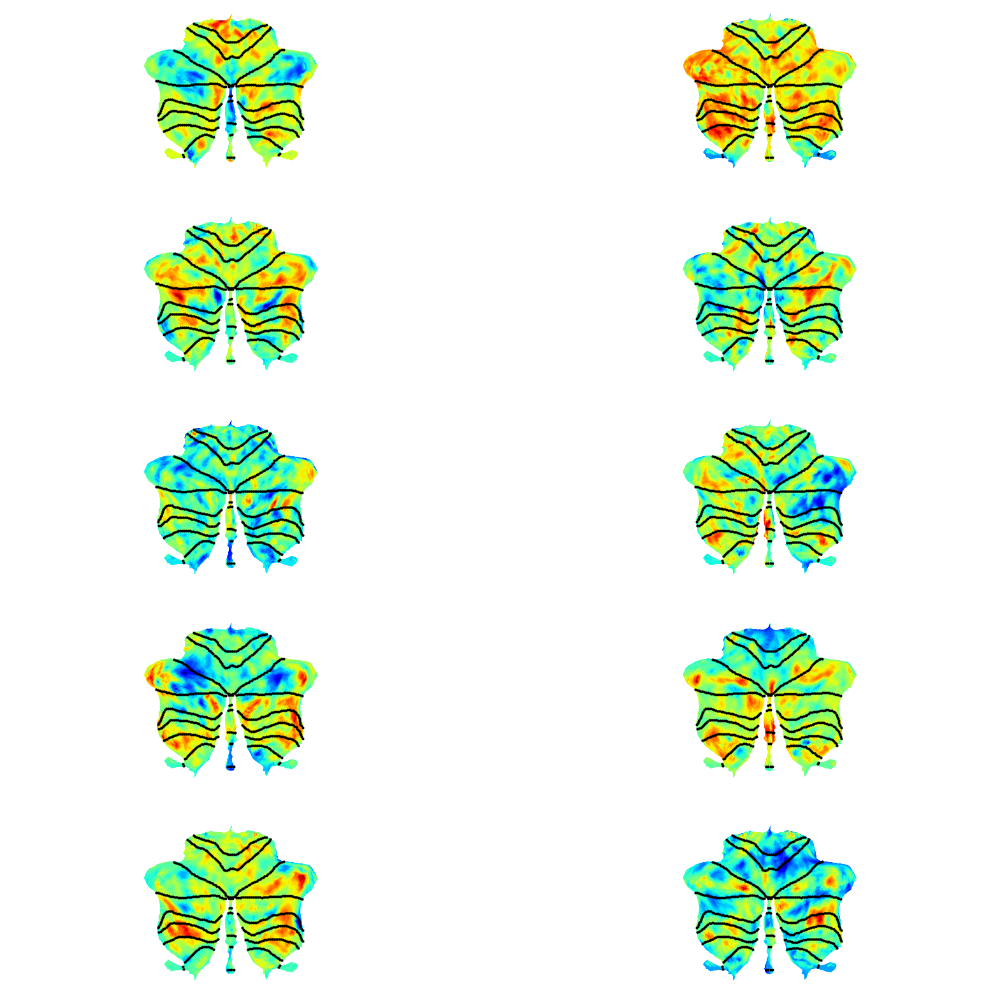

In [82]:

plt.figure(figsize=(20, 20))
plot_multi_flat(data_rest[:10,2,:], atlas='MNISymC2', dtype='func', grid=(5, 2))